<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Análisis Espacial y Machine Learning de Hurtos en Medellín**
Este Jupyter Notebook presenta una aplicación avanzada de técnicas de machine learning para el análisis espacial de los hurtos ocurridos en los barrios de Medellín, Colombia. Basado en el análisis exploratorio previo y los datos geoespaciales, se implementan métodos de clustering y otras técnicas de machine learning para identificar patrones y riesgos en diferentes áreas de la ciudad.

***Creado por John Alberto Garcia, estudiante de economia de la Universidad Pontificia Bolivariana***.
[Linkedin](https://www.linkedin.com/in/johnalbertogarcia)

#**Descripción del Proyecto**

El objetivo principal de esta parte del proyecto es aplicar técnicas de machine learning para descubrir patrones ocultos y segmentar las áreas de la ciudad según el riesgo de hurtos. Esto incluye:

**Descubrimiento de Patrones Ocultos:** Utilizando algoritmos de machine learning, se identifican patrones subyacentes en los datos de hurtos que no son fácilmente observables mediante técnicas de análisis tradicionales. Esto permite una comprensión más profunda de las dinámicas delictivas en Medellín.

**Segmentación de Áreas:** Aplicando técnicas de clustering, se agrupan las diferentes áreas de la ciudad según características similares relacionadas con los hurtos. Esto ayuda a identificar zonas con perfiles de riesgo específicos y a focalizar las estrategias de prevención.

**Implementación de Modelos de Clustering:** Se utilizan diversos algoritmos de clustering, tales como K-Means, DBSCAN y Affinity Propagation, para agrupar los datos de hurtos. Cada modelo se evalúa en términos de su capacidad para formar clusters coherentes y significativos.

**Evaluación del Rendimiento del Modelo:** A través de métricas de validación y evaluación como la puntuación de silueta y la inercia, se determina la efectividad de los modelos de clustering. Esto asegura que los clusters formados sean lo más representativos y útiles posibles.

**Visualización de Resultados:** Los resultados del clustering se visualizan mediante gráficos y mapas interactivos, proporcionando una representación clara y comprensible de las áreas de riesgo. Estas visualizaciones son cruciales para comunicar los hallazgos de manera efectiva a audiencias no técnicas.

**Interpretabilidad y Explicabilidad del Modelo:** Se implementan técnicas como SHAP (SHapley Additive exPlanations) para interpretar los resultados de los modelos y entender la importancia de cada característica en la formación de clusters. Esto añade una capa de transparencia y confianza en los resultados obtenidos.

##**Contenido del Notebook**

El Notebook incluye la preparación y limpieza de los datos de hurtos y geoespaciales, asegurando que los datos sean adecuados para el análisis de machine learning. Además, se realiza feature engineering, creando nuevas características que puedan mejorar el rendimiento de los modelos, incluyendo variables temporales, geográficas y demográficas. Se implementan técnicas de clustering como K-Means, DBSCAN y Affinity Propagation para segmentar los hurtos en diferentes grupos según características similares. Se utilizan técnicas de validación cruzada y métricas como la silueta y la inercia para evaluar el rendimiento de los modelos de clustering. Los resultados se visualizan mediante mapas y gráficos para entender mejor las áreas de alto riesgo en Medellín. Se emplean técnicas como SHAP para interpretar los modelos y entender la importancia de las características en las predicciones. Finalmente, se consideran recomendaciones para el despliegue del modelo en un entorno de producción, proporcionando sugerencias sobre cómo integrar el modelo en sistemas de alerta temprana o aplicaciones de seguridad.

# Importando las librerias necesarias

In [3]:
import subprocess
import warnings ; warnings.warn = lambda *args,**kwargs: None
subprocess.run(['pip', 'install', 'osmnx'], stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

CompletedProcess(args=['pip', 'install', 'osmnx'], returncode=0)

In [4]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from shapely.geometry import Point
from shapely.ops import nearest_points
import osmnx as ox
from sklearn.datasets import make_classification
from sklearn.cluster import AffinityPropagation
from numpy import unique
from numpy import where
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder

# **Cargue de Archivo de hurtos a personas en Medellin**

In [5]:
 drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv")
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")

##**Definición de los Años de Interés y Filtrado de Datos**

Debido al coste computacional asociado con el manejo de grandes volúmenes de datos, se agrega la posibilidad de filtrar los años de interés. Esto permite concentrar el análisis en un período específico y reducir la carga computacional, mejorando la eficiencia del procesamiento de datos y la ejecución de los algoritmos de machine learning, se puede modificar el rango ajustando

```
año_inicio = int
año_fin = int
```






In [7]:
año_inicio = 2003
año_fin = 2022

hurto_a_persona = hurto_a_persona[
    (hurto_a_persona['fecha_hecho'].dt.year >= año_inicio) &
    (hurto_a_persona['fecha_hecho'].dt.year <= año_fin)
]


#**Filtrado** de Valores Atípicos Basado en Intervalos de Confianza
Para eliminar valores atípicos en las coordenadas de latitud y longitud, se calculan los intervalos de confianza utilizando la media y la desviación estándar de cada variable. A continuación, se describen los pasos realizados:

**Qué se hace:** Se calcula la media y la desviación estándar para latitud y longitud, se establecen límites utilizando un factor multiplicador de la desviación estándar, y se filtran los datos para mantener solo aquellos dentro de los límites.

El factor multiplica la desviación estándar para determinar cuánto se extiende el rango de valores aceptables desde la media. En este caso, se multiplica por 2 (factor = 2), lo que significa que los límites se establecen a ±2 desviaciones estándar alrededor de la media.

In [8]:
media_lat = hurto_a_persona['latitud'].mean()
std_lat = hurto_a_persona['latitud'].std()

media_long = hurto_a_persona['longitud'].mean()
std_long = hurto_a_persona['longitud'].std()

factor = 2

limite_inferior_lat = media_lat - factor * std_lat
limite_superior_lat = media_lat + factor * std_lat

limite_inferior_long = media_long - factor * std_long
limite_superior_long = media_long + factor * std_long

hurto_a_persona_filtrado = hurto_a_persona[
    (hurto_a_persona['latitud'] >= limite_inferior_lat) &
    (hurto_a_persona['latitud'] <= limite_superior_lat) &
    (hurto_a_persona['longitud'] >= limite_inferior_long) &
    (hurto_a_persona['longitud'] <= limite_superior_long)
]

#**Visualización de Datos Originales y Filtrados**
Para comparar la distribución geográfica de los datos originales y los datos filtrados, se crea una figura con dos subplots que muestran ambos conjuntos de datos sobre un mapa de los barrios de Medellín.

**Qué se hace:** Se utilizan dos subplots para visualizar y comparar los datos originales y los datos filtrados, ambos superpuestos sobre un mapa de los barrios.

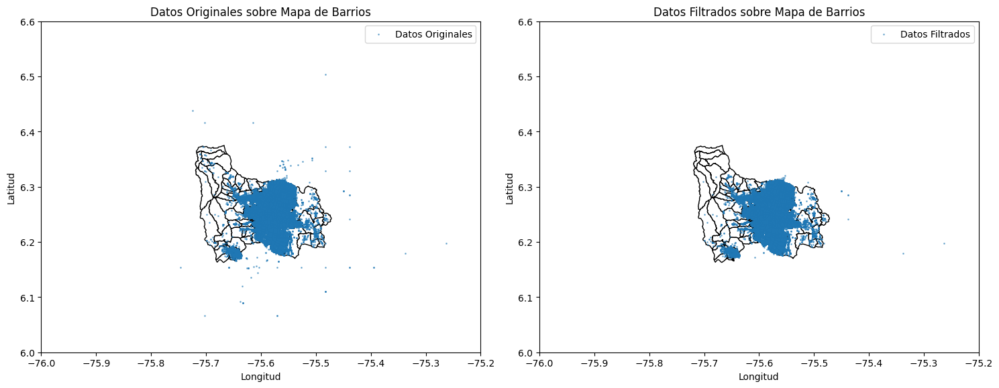

In [9]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))


barrios.plot(ax=ax1, edgecolor='black', color='white')
ax1.scatter(hurto_a_persona['longitud'], hurto_a_persona['latitud'], s=1, alpha=0.5, label='Datos Originales')
ax1.set_title('Datos Originales sobre Mapa de Barrios')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.set_xlim(-76, -75.2)
ax1.set_ylim(6, 6.6)
ax1.legend()

barrios.plot(ax=ax2, edgecolor='black', color='white')
ax2.scatter(hurto_a_persona_filtrado['longitud'], hurto_a_persona_filtrado['latitud'], s=1, alpha=0.5, label='Datos Filtrados')
ax2.set_title('Datos Filtrados sobre Mapa de Barrios')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.set_xlim(-76, -75.2)
ax2.set_ylim(6, 6.6)
ax2.legend()

plt.tight_layout()
plt.show()
hurto_a_persona = hurto_a_persona_filtrado

# **Agrupación de Categorías de Lugares**

Para simplificar las categorías de los lugares donde ocurren los hurtos, se utiliza un diccionario de mapeo que reduce la dimensionalidad de las variables originales agrupándolas en categorías más generales.

**Qué se hace:** Se crea un nuevo campo lugar_agrupado en el dataframe hurto_a_persona, que agrupa las categorías específicas de lugares en categorías más generales utilizando un diccionario de mapeo.

In [10]:
mapeo_categorias = {
    'Vía pública': 'Transporte',
    'Terminal de transporte': 'Transporte',
    'Estación del Metro': 'Transporte',
    'Estación del Metro plus': 'Transporte',
    'Paradero de bus': 'Transporte',
    'Aeropuerto': 'Transporte',
    'Puente peatonal': 'Transporte',
    'Metro Plus': 'Transporte',
    'Peaje': 'Transporte',
    'Institución de educación superior': 'Educación',
    'Institución educativa (jardín, primaria o secundaria)': 'Educación',
    'Residencia': 'Residencial',
    'Casa o apartamento': 'Residencial',
    'Conjunto residencial': 'Residencial',
    'Caseta vigilancia conjunto residencial': 'Residencial',
    'Centro comercial': 'Comercial',
    'Local comercial': 'Comercial',
    'Supermercado': 'Comercial',
    'Almacén tienda y otro': 'Comercial',
    'Plaza de mercado': 'Comercial',
    'Joyería': 'Comercial',
    'Compraventa': 'Comercial',
    'Bar o cantina': 'Entretenimiento',
    'Casino': 'Entretenimiento',
    'Teatro': 'Entretenimiento',
    'Parque': 'Entretenimiento',
    'Escenario deportivo': 'Entretenimiento',
    'Gimnasio': 'Entretenimiento',
    'Estadero': 'Entretenimiento',
    'Hospital o centro de salud': 'Salud',
    'Oficina': 'Servicios',
    'Hotel, motel y hostal': 'Servicios',
    'Restaurante': 'Servicios',
    'Taller mecánico': 'Servicios',
    'Droguería o farmacia': 'Servicios',
    'Biblioteca': 'Servicios',
    'Cementerio': 'Servicios',
    'Instalación judicial': 'Servicios',
    'Panadería': 'Servicios',
    'Instalación fuerza pública': 'Servicios',
    'Sede social, club, auditorio o similar': 'Servicios',
    'Funeraria y sala de velación': 'Servicios',
    'Baño': 'Servicios',
    'Sede política': 'Servicios',
    'Cafetería': 'Servicios',
    'Café internet': 'Servicios',
    'Consultorio jurídico': 'Servicios',
    'Lavadero de carros': 'Servicios',
    'Obra en construcción': 'Otros',
    'Quebrada o rio': 'Otros',
    'Reserva natural': 'Otros',
    'Lote baldío': 'Otros',
    'Potrero': 'Otros',
    'Matadero, carnicería y similar': 'Otros',
    'Hipodromo': 'Otros',
    'Cantera': 'Otros',
    'Finca': 'Otros',
    'Feria de ganado': 'Otros',
    'Desguazadero': 'Otros',
    'Sin dato': 'Otros',
    'Fábrica o empresa': 'Industria',
    'Vehículo particular': 'Transporte',
    'Parqueadero': 'Comercial',
    'Banco': 'Servicios',
    'Bus de servicio público': 'Transporte',
    'Estación de gasolina': 'Comercial',
    'Casa de apuesta': 'Entretenimiento',
    'Piscina': 'Entretenimiento',
    'Bodega': 'Comercial',
    'Iglesia': 'Religioso',
    'Edificio': 'Comercial',
    'Cajero electrónico': 'Servicios',
    'Instalación gubernamental': 'Servicios',
    'Centro de belleza o estética': 'Servicios',
    'Plaza de toros': 'Entretenimiento',
    'Turístico': 'Entretenimiento',
    'Caseta de vigilancia empresa': 'Seguridad',
    'Laboratorios de procesamiento de droga ílicita': 'Salud',
    'Montallanta': 'Servicios',
    'Corporación': 'Servicios',
    'Cárcel': 'Seguridad',
    'Hogar de paso': 'Residencial',
    'Billar': 'Entretenimiento',
    'Albergue': 'Residencial',
    'Zona boscosa': 'Otros',
    'Empresa de transporte': 'Transporte',
    'Puesto de trabajo': 'Otros',
    'Prostíbulo': 'Entretenimiento',
    'Librería': 'Comercial',
    'Metro': 'Transporte',
    'Represa o laguna': 'Otros'
}

hurto_a_persona['lugar_agrupado'] = hurto_a_persona['lugar'].map(mapeo_categorias)


# **Agrupación de Categorías de Modalidades de robo**


In [11]:
mapeo_modalidades = {
    'Atraco': 'Robo con Violencia o Amenaza',
    'Descuido': 'Robo con Engaño o Sin Violencia',
    'Cosquilleo': 'Robo con Engaño o Sin Violencia',
    'Raponazo': 'Robo con Violencia o Amenaza',
    'Sin dato': 'Delitos Específicos',
    'Engaño': 'Robo con Engaño o Sin Violencia',
    'Rompimiento cerraduta': 'Robo por Rompimiento o Acceso Forzado',
    'Escopolamina': 'Robo con Engaño o Sin Violencia',
    'Rompimiento de ventana': 'Robo por Rompimiento o Acceso Forzado',
    'Halado': 'Robo con Violencia o Amenaza',
    'Rompimiento cerradura': 'Robo por Rompimiento o Acceso Forzado',
    'Clonación de tarjeta': 'Robo con Engaño o Sin Violencia',
    'Comisión de delito': 'Delitos Específicos',
    'Suplantación': 'Robo con Engaño o Sin Violencia',
    'Paquete chileno': 'Robo con Engaño o Sin Violencia',
    'Abuso de confianza': 'Robo con Engaño o Sin Violencia',
    'Informático': 'Robo con Engaño o Sin Violencia',
    'Llave maestra': 'Robo con Engaño o Sin Violencia',
    'Fleteo': 'Robo con Violencia o Amenaza',
    'Miedo o terror': 'Delitos Específicos',
    'Simulando necesidad': 'Robo con Engaño o Sin Violencia',
    'Retención de tarjeta': 'Delitos Específicos',
    'Llamada millonaria': 'Robo con Engaño o Sin Violencia',
    'Forcejeo': 'Robo con Violencia o Amenaza',
    'Retención de dinero': 'Delitos Específicos',
    'Tóxico o agente químico': 'Robo con Engaño o Sin Violencia',
    'Enfrentamiento con la fuerza pública': 'Delitos Específicos',
    'Auto robo': 'Delitos Específicos',
    'Violencia intrafamiliar': 'Robo con Violencia o Amenaza',
    'Vandalismo': 'Robo por Rompimiento o Acceso Forzado'
}
hurto_a_persona['modalidad'] = hurto_a_persona['modalidad'].map(mapeo_modalidades)

# **Limpieza de Datos Geográficos**
Para asegurar que los datos utilizados en el análisis contengan valores válidos de coordenadas geográficas, se eliminan las filas con valores nulos o ceros en las columnas de latitud y longitud.

**Qué se hace:** Se eliminan las filas con valores nulos en las columnas latitud y longitud, y luego se eliminan las filas donde estas columnas tengan el valor 0.

In [12]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

# **Lectura de Archivo Shapefile y Asociación Espacial de Datos**
**Qué se hace**
Se lee el archivo Shapefile que contiene información geoespacial de barrios y veredas de Medellín, luego se crea un GeoDataFrame a partir de datos limpios de hurtos, asignando geometrías basadas en coordenadas de longitud y latitud. Finalmente, se realiza una unión espacial entre los datos de hurtos y los barrios/veredas.

**Descripción y Propósito**
Se utiliza el archivo Shapefile BarrioVereda_2014.shp para obtener los límites geográficos de los barrios y veredas de Medellín. Posteriormente, se crea un GeoDataFrame (gdf_hurtos) que contiene los datos de hurtos con coordenadas geográficas convertidas en geometrías. La unión espacial (gpd.sjoin) entre estos dos conjuntos de datos permite asociar cada registro de hurto con su respectivo barrio o vereda, facilitando el análisis geográfico y la visualización de patrones de crímenes por área.

In [13]:
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)

#**Feature engineering**

# **Agrupación por Edad**
**Qué se hace**
Se define un conjunto de intervalos de edad (bins) y etiquetas correspondientes (labels). Luego, se crea una nueva columna en el DataFrame hurto_barrios llamada grupo_edad, que asigna a cada registro de acuerdo al intervalo de edad al que pertenece.

**Descripción y Propósito**
El proceso de ingeniería de características permite categorizar las edades de las personas involucradas en los hurtos en grupos específicos. Esto facilita el análisis posterior, permitiendo examinar cómo varía la incidencia delictiva según diferentes rangos de edad. El uso de intervalos predefinidos ayuda a simplificar y estructurar los datos, mejorando la comprensión de patrones demográficos relacionados con los hurtos en Medellín.

In [14]:
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

La conversión de la columna 'fecha_hecho' a datetime es crucial para facilitar el análisis temporal de los datos de hurtos. Permite realizar operaciones y comparaciones temporales de manera efectiva, como agrupar por meses, días de la semana o calcular la diferencia entre fechas. Esta transformación es esencial para el análisis de series temporales y para entender la evolución de los patrones delictivos a lo largo del tiempo en diferentes áreas de Medellín.

In [15]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

# **Extracción de Características Temporales**
**Qué se hace**
Se extraen diversas características temporales de la columna 'fecha_hecho' en el DataFrame hurto_barrios, como el año, mes, día de la semana, hora y día del mes. Luego, se realiza un agrupamiento por mes para contar la cantidad de hurtos registrados en cada mes.

**Descripción y Propósito**
La extracción de características temporales permite analizar cómo varían los hurtos según diferentes aspectos temporales. Al agrupar por mes y día del mes, se pueden identificar patrones estacionales o diarios en la incidencia delictiva. Además, conocer la hora del día y el día de la semana de los hurtos ayuda a entender cuándo y en qué circunstancias ocurren con mayor frecuencia estos eventos.

In [16]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()
hurto_barrios['dia_mes'] = hurto_barrios['fecha_hecho'].dt.day

# **Proceso de Cálculo de Distancias a Amenidades Más Cercanas**

Definición de Función ***obtener_punto_representativo***

Esta función se utiliza para obtener un punto representativo de geometrías poligonales o multipoligonales, que se pueden utilizar para calcular distancias de manera más eficiente.

In [17]:
def obtener_punto_representativo(geometry):
    if geometry.geom_type.startswith('Multi') or geometry.geom_type == 'Polygon':
        return geometry.representative_point()
    else:
        return geometry

**Obtención de Geometrías de Amenidades**

El objetivo de este código es calcular la distancia entre cada incidente de robo y una selección específica de amenidades elegidas. Esto enriquece la información disponible sobre cada robo al proporcionar contexto adicional. Además, permite una mayor flexibilidad al permitir la inclusión de otras amenidades simplemente agregándolas a la lista amenities.

[Lista de valores de amenidades posibles](https://wiki.openstreetmap.org/wiki/Key:amenity)

In [18]:
amenidades = ["bank", "police", "university", "restaurant"]

gdf_amenidades = {}

for amenidad in amenidades:
    gdf_amenidad = ox.geometries_from_place("Medellin", tags={"amenity": amenidad})
    gdf_amenidad['geometry'] = gdf_amenidad['geometry'].apply(obtener_punto_representativo)
    gdf_amenidades[amenidad] = gdf_amenidad

hurto_barrios = hurto_barrios.set_crs(gdf_amenidades[amenidades[0]].crs)

def calcular_distancia_a_amenidad_mas_cercana(punto_robo, gdf_amenidad):
    amenidad_mas_cercana = gdf_amenidad.geometry.unary_union
    punto_mas_cercano = nearest_points(punto_robo, amenidad_mas_cercana)[1]
    return punto_robo.distance(punto_mas_cercano)

for amenidad in amenidades:
    hurto_barrios[f'distancia_a_{amenidad}_mas_cercana'] = hurto_barrios['geometry'].apply(
        calcular_distancia_a_amenidad_mas_cercana, gdf_amenidad=gdf_amenidades[amenidad]
    )

El feature engineering juega un papel fundamental en el aprendizaje automático al transformar datos crudos en características significativas y relevantes para los modelos. Este proceso es crucial porque permite capturar mejor la estructura subyacente de los datos y mejorar la capacidad predictiva de los modelos. En el contexto específico del análisis de hurtos en Medellín, el enriquecimiento de datos mediante la extracción de características temporales, espaciales y relacionadas con amenidades facilita la identificación de patrones complejos y relaciones ocultas. Por ejemplo, al calcular las distancias a las amenidades más cercanas, se puede entender mejor cómo la proximidad a sitios de interes puede influir en la distribución y frecuencia de los hurtos en diferentes áreas de la ciudad. Esto no solo proporciona insights cruciales para la formulación de políticas de seguridad y prevención delictiva, sino que también mejora la precisión y eficacia de los modelos de aprendizaje automático al incorporar variables relevantes que impactan directamente en el fenómeno estudiado.

# **Selección de Columnas para Modelado**
En esta etapa, se han seleccionado específicamente ciertas variables de interés del conjunto de datos hurto_barrios que son relevantes para el análisis y modelado de los incidentes de hurto en Medellín. Estas columnas seleccionadas son las siguientes:


*   **latitud**: Coordenada geográfica que indica la posición norte-sur del lugar del hurto.

*   **longitud**: Coordenada geográfica que indica la posición este-oeste del lugar del hurto.

*   **sexo**: Género de la persona afectada por el hurto.

*   **edad**: Edad de la persona afectada por el hurto.

*   **lugar_agrupado**: Categorización del lugar donde ocurrió el hurto.


*   **mes_hecho**: Mes en que ocurrió el hurto.


*   **dia_semana_hecho**: Día de la semana en que ocurrió el hurto.


*   **hora**: Hora del día en que ocurrió el hurto.

*   **dia_mes**: Día del mes en que ocurrió el hurto.

*   **medio_transporte**: Medio de transporte utilizado durante el hurto.

*   **modalidad**: Tipo específico de hurto según el modus operandi.



*   **distancia_a_bank_mas_cercana**: Distancia al banco más cercano desde el lugar del hurto.
*  **distancia_a_police_mas_cercana**: Distancia a la estación de policía más cercana desde el lugar del hurto.



*   **distancia_a_university_mas_cercana**: Distancia a la universidad más cercana desde el lugar del hurto.
*   **distancia_a_restaurant_mas_cercana**: Distancia al restaurante más cercano desde el lugar del hurto.

*   **arma_medio**: arma usada en el hurto, si es "No" es porque no fue usada ningun arma.

Estas variables fueron seleccionadas por su relevancia potencial para explicar y predecir los patrones de hurtos en Medellín, considerando tanto aspectos espaciales como temporales, demográficos y relacionados con la proximidad a ciertas amenidades. Esta selección asegura que los modelos de aprendizaje automático puedan capturar adecuadamente la complejidad de los datos y generar predicciones útiles para la seguridad pública y la prevención del crimen.


**La lista columna_datos contiene las variables seleccionadas para alimentar tanto los modelos de predicción como los modelos de clustering.**








In [19]:
columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","mes_hecho","dia_semana_hecho","hora","dia_mes","medio_transporte","modalidad","distancia_a_bank_mas_cercana","distancia_a_police_mas_cercana","distancia_a_university_mas_cercana","distancia_a_restaurant_mas_cercana","arma_medio","grupo_bien"]

La lista **columnas_datos_modelos** representa el conjunto de variables que impulsan tanto los modelos predictivos que se usaran en el estudio del crimen en Medellín. Estas variables no son simples datos, sino hilos que tejen una narrativa compleja sobre cómo la geografía, el perfil demográfico y otras características pueden influir en la modalidad de los robos en la ciudad.

Imaginemos una red de cámaras de vigilancia estratégicamente ubicadas en Medellín, cada una capturando datos precisos y georeferenciados. A través de estas lentes digitales, observamos más allá de las coordenadas geográficas: vemos patrones emergentes en los datos, donde la ubicación específica, la hora del día, el tipo de transporte utilizado y otras variables no solo proporcionan contexto, sino que revelan conexiones sutiles pero significativas.

Por ejemplo, la edad y el sexo pueden jugar un papel crucial en cómo y dónde se cometen los robos. Los días de la semana y los meses del año podrían revelar fluctuaciones estacionales en los patrones delictivos. Además, la distancia a servicios como bancos, comisarías, universidades y restaurantes no solo define la proximidad física, sino que también podría indicar áreas de mayor o menor riesgo.

Este enfoque analítico no solo busca prever el tipo de robo que podría ocurrir en una ubicación específica, sino que también proporciona información esencial para diseñar estrategias preventivas más efectivas. Al entender cómo estas variables se entrelazan, podemos no solo anticipar, sino también intervenir de manera proactiva para mitigar riesgos y promover la seguridad en la comunidad.

In [20]:
columnas_datos_modelos = ["modalidad","latitud","longitud","sexo","edad","lugar_agrupado","mes_hecho","dia_semana_hecho","hora","dia_mes","medio_transporte","distancia_a_bank_mas_cercana","distancia_a_police_mas_cercana","distancia_a_university_mas_cercana","distancia_a_restaurant_mas_cercana"]

Limpieza de datos

In [21]:
datos = hurto_barrios[columnas_datos]
datos = datos.dropna()
datos_modelos = datos[columnas_datos_modelos]

# **Mapeo de variables categoricas**

## **Importancia del Mapeo de Variables Categóricas a Numéricas**
El mapeo de variables categóricas a numéricas es un paso fundamental en el preprocesamiento de datos antes de aplicar técnicas de machine learning. Aquí se explica su importancia:

**Requerimiento de Modelos de Aprendizaje Automático:** Los algoritmos de machine learning suelen requerir que los datos de entrada sean numéricos. Las variables categóricas, como el sexo o el tipo de lugar donde ocurre el hurto, son representadas como cadenas de texto o categorías que deben ser convertidas a valores numéricos para que los modelos puedan entenderlas y procesarlas correctamente.

**Facilita el Cálculo de Distancias y Similitudes:** Al convertir las variables categóricas a numéricas, podemos calcular distancias y similitudes entre observaciones de manera más eficiente. Esto es crucial para algoritmos de clustering y métodos de aprendizaje supervisado que se basan en medidas de proximidad entre puntos de datos.

**Mejora del Rendimiento del Modelo:** Los modelos de machine learning pueden interpretar y utilizar mejor las variables numéricas para hacer predicciones precisas. Esto se debe a que los valores numéricos pueden ser escalados, normalizados y utilizados directamente en cálculos matemáticos sin necesidad de transformaciones adicionales.

**Reducción de Dimensionalidad:** En algunos casos, convertir variables categóricas a numéricas puede ayudar a reducir la dimensionalidad del conjunto de datos, lo que simplifica el modelado y puede mejorar la eficiencia computacional.

Para el mapeo de variables para el modelo predictivo se opta por trabajar con una codificacion one-hot, La codificación one-hot (también conocida como one-of-K encoding) es una técnica utilizada para convertir variables categóricas en un formato que puede ser utilizado por algoritmos de machine learning y estadísticos. Aquí te explico cómo funciona y por qué es útil:

**Funcionamiento de la Codificación One-Hot**
Creación de Nuevas Columnas: Para cada variable categórica, se crea un conjunto de nuevas columnas binarias (0 o 1), igual al número de categorías únicas presentes en esa variable.

**Asignación de Valores:** En cada fila de datos, la columna correspondiente a la categoría de esa fila tendrá un valor de 1, mientras que todas las demás columnas tendrán un valor de 0.


En este paso, identificamos las columnas que contienen datos categóricos en el DataFrame datos_modelos. Esta identificación es esencial para el preprocesamiento de datos, ya que las variables categóricas necesitan ser transformadas a un formato numérico antes de ser utilizadas en los modelos de machine learning.

Primero, seleccionamos las columnas categóricas en datos_modelos utilizando select_dtypes(include=['object']). Luego, removemos la columna modalidad de la lista de columnas categóricas, ya que modalidad es nuestra variable objetivo para predicción y no debe ser transformada en esta etapa del preprocesamiento.

In [22]:
columnas_categoricas = datos_modelos.select_dtypes(include=['object']).columns.tolist()
columnas_categoricas.remove('modalidad')

In [23]:
encoder = OneHotEncoder(sparse=False)
one_hot_encoded = encoder.fit_transform(datos_modelos[columnas_categoricas])
one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(columnas_categoricas))
datos_modelos = pd.concat([datos_modelos.drop(columns=columnas_categoricas).reset_index(drop=True), one_hot_df.reset_index(drop=True)], axis=1)

# **Cálculo de Valores NaN por Columna**
En este fragmento de código, estamos interesados en conocer cuántos valores NaN **(Not a Number)** hay en cada columna de datos_modelos. Este tipo de análisis es crucial en el preprocesamiento de datos antes de aplicar modelos de machine learning, ya que nos permite entender la integridad y la calidad de los datos disponibles.

In [24]:
nan_por_columna = datos_modelos.isna().sum()

print("Cantidad de NaN por cada columna:")
print(nan_por_columna)

Cantidad de NaN por cada columna:
modalidad                                      0
latitud                                        0
longitud                                       0
edad                                           0
mes_hecho                                      0
hora                                           0
dia_mes                                        0
distancia_a_bank_mas_cercana                   0
distancia_a_police_mas_cercana                 0
distancia_a_university_mas_cercana             0
distancia_a_restaurant_mas_cercana             0
sexo_Hombre                                    0
sexo_Mujer                                     0
sexo_Sin dato                                  0
lugar_agrupado_Comercial                       0
lugar_agrupado_Educación                       0
lugar_agrupado_Entretenimiento                 0
lugar_agrupado_Industria                       0
lugar_agrupado_Otros                           0
lugar_agrupado_Religioso           

# **Codificación de la Variable Objetivo**
En esta etapa, transformamos la variable objetivo modalidad a un formato numérico. Esto es fundamental para que los modelos de machine learning puedan procesar y aprender de esta variable correctamente.

In [25]:
datos_modelos['modalidad'] = datos_modelos['modalidad'].astype('category').cat.codes

#**Introducción a XGBoost**

XGBoost (eXtreme Gradient Boosting) es un algoritmo de machine learning basado en árboles de decisión que utiliza el enfoque de boosting. El boosting es una técnica en la que se combinan varios modelos débiles (árboles de decisión) para crear un modelo fuerte y robusto. XGBoost ha ganado popularidad por su rendimiento y eficiencia en diversas tareas de predicción.

#### **Fundamentos Matemáticos de XGBoost**

El objetivo principal de XGBoost es minimizar una función de pérdida $\mathcal{L}$, que mide la discrepancia entre las predicciones del modelo y los valores reales. La función de pérdida para un modelo de regresión puede ser, por ejemplo, la pérdida cuadrática:

$$ \mathcal{L}(\hat{y}, y) = \sum_{i=1}^n (\hat{y}_i - y_i)^2 $$

donde $\hat{y}_i$ son las predicciones y $y_i$ son los valores reales. Para modelos de clasificación, una función de pérdida común es la pérdida logística:

$$ \mathcal{L}(\hat{y}, y) = -\sum_{i=1}^n [y_i \log(\hat{y}_i) + (1 - y_i) \log(1 - \hat{y}_i)] $$

En el contexto de boosting, XGBoost construye el modelo de manera aditiva, ajustando iterativamente árboles de decisión para corregir los errores de las predicciones anteriores. La predicción en la iteración $t$ es:

$$ \hat{y}_i^{(t)} = \hat{y}_i^{(t-1)} + f_t(x_i) $$

donde $f_t$ es el árbol de decisión ajustado en la iteración $t$. La función objetivo que XGBoost optimiza incluye tanto la función de pérdida como un término de regularización para evitar el sobreajuste:

$$ \mathcal{L}_{\text{obj}} = \mathcal{L}(\hat{y}, y) + \sum_{k=1}^T \Omega(f_k) $$

donde $\Omega(f_k)$ es el término de regularización que penaliza la complejidad del modelo.

#### ¿Por Qué XGBoost es Adecuado para Predecir Robos?

1. **Manejo de Datos Heterogéneos**: Los datos sobre robos suelen ser heterogéneos, con variables categóricas y continuas. XGBoost maneja bien esta heterogeneidad.
   
2. **Eficiencia Computacional**: XGBoost está diseñado para ser altamente eficiente en términos de tiempo de computación y uso de memoria, lo cual es crucial para grandes conjuntos de datos.

3. **Capacidad de Generalización**: Gracias al término de regularización, XGBoost tiende a evitar el sobreajuste, lo que mejora la capacidad del modelo para generalizar a datos no vistos.

4. **Flexibilidad y Personalización**: XGBoost permite ajustar una gran cantidad de hiperparámetros, lo que brinda flexibilidad para adaptarse a las características específicas del problema de predicción de robos.

5. **Manejo de Valores Faltantes**: XGBoost maneja internamente los valores faltantes, lo que reduce la necesidad de preprocesamiento de datos.


# **Implementacion del XGBoost**

Vamos a implementar el modelo XGBoost para predecir la modalidad de robo usando las características seleccionadas. Este proceso incluirá la separación de los datos en conjuntos de entrenamiento y prueba, la creación y entrenamiento del modelo, y la evaluación de su rendimiento.

In [26]:
x = datos_modelos.drop("modalidad", axis=1)
y = datos_modelos["modalidad"]

# **Separación de los Datos en Conjuntos de Entrenamiento y Prueba**


In [27]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# **Explicación de la Selección de Hiperparámetros del Modelo XGBoost**

**learning_rate = 0.3**

El parámetro learning_rate, también conocido como tasa de aprendizaje, controla el tamaño de los pasos que el modelo da durante la optimización. Es crucial monitorizar este valor para evitar sobreajuste, ya que tasas de aprendizaje muy altas pueden hacer que el modelo se ajuste demasiado rápido a los datos de entrenamiento, perdiendo su capacidad de generalización.

**max_depth = 12**

El parámetro max_depth determina la profundidad máxima de cada árbol en el modelo. Un valor de 12 permite que el modelo capture interacciones complejas entre las variables, lo que es especialmente útil en conjuntos de datos con estructuras intrincadas como el nuestro. No obstante, profundidades muy grandes pueden llevar al sobreajuste, por lo que este valor ha sido seleccionado para equilibrar la capacidad del modelo y su robustez.

**n_estimators = 150**

El parámetro n_estimators especifica el número de árboles que se construirán en el modelo. Con 150 estimadores, buscamos un balance entre un modelo suficientemente complejo para capturar las relaciones en los datos y uno que no sea excesivamente complejo para evitar el sobreajuste. Este número de estimadores proporciona al modelo suficiente capacidad de aprendizaje sin ser excesivamente costoso en términos computacionales.

**objective = 'multi:softmax'**

El parámetro objective define la función objetivo del modelo. En este caso, 'multi:softmax' indica que estamos abordando un problema de clasificación multiclase. Esta función objetivo permite que el modelo prediga probabilidades para cada clase y asigne la clase con la probabilidad más alta a cada observación.

**num_class = len(y.unique())**

El parámetro num_class define el número de clases distintas en la variable objetivo. En nuestro caso, len(y.unique()) asegura que el modelo está configurado para el número correcto de clases presentes en los datos de modalidad de robo.

In [28]:
model = XGBClassifier(learning_rate= 0.3,max_depth = 12, n_estimators=150,objective='multi:softmax', num_class=len(y.unique()) )

# **Entrenamiento del Modelo XGBoost**
Para entrenar nuestro modelo XGBoost con los datos de entrenamiento, utilizamos el método fit del objeto XGBClassifier. Este método ajusta el modelo a los datos, encontrando los mejores parámetros que minimizan la función objetivo para nuestras variables de entrada y salida.

In [29]:
model.fit(X_train, y_train)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=12, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None, num_class=4,
              num_parallel_tree=None, ...)

# **Visualización de la Importancia de las Características**
Para evaluar qué características son más relevantes en nuestro modelo XGBoost, podemos visualizar la importancia de cada característica. XGBoost ofrece varias formas de medir la importancia de las características, como weight, gain y cover. Aquí utilizaremos el tipo weight, que mide el número de veces que una característica es utilizada en los árboles del modelo.

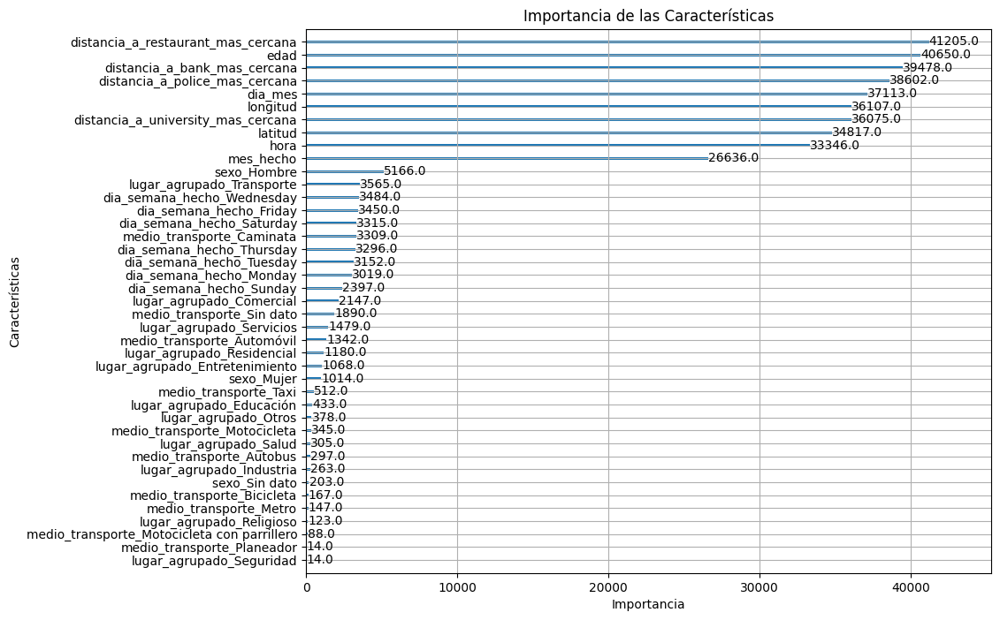

In [30]:
plt.figure(figsize=(10, 8))
xgb.plot_importance(model, ax=plt.gca(), importance_type='weight')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.title('Importancia de las Características')
plt.show()

# **Evaluación del Modelo XGBoost**
Para evaluar el rendimiento del modelo XGBoost, utilizamos la función score, que calcula la precisión del modelo en el conjunto de entrenamiento.

In [31]:
model.score(X_train, y_train)

0.9811622561027751

#**Evaluar en el Conjunto de Prueba**
Evaluar el modelo en el conjunto de prueba es fundamental para entender cómo se desempeña en datos que no ha visto durante el entrenamiento. Esto nos da una idea más realista de la capacidad de generalización del modelo y nos ayuda a detectar si existe sobreajuste (overfitting) al conjunto de entrenamiento.

In [32]:
model.score(X_test, y_test)

0.8065186263233257

# **Vista de las predicciones**

In [33]:
predict = model.predict(X_test)
print("Predicciones:")
print(predict[:10])
print("Valores reales:")
print(np.array(y_test[:10]))

Predicciones:
[2 2 1 2 2 1 1 2 1 3]
Valores reales:
[2 2 1 2 2 1 1 2 2 3]


In [34]:
from sklearn.metrics import confusion_matrix

# **Matriz de Confusión para Evaluar el Modelo**
La matriz de confusión es una herramienta fundamental en la evaluación de modelos de clasificación. Nos permite visualizar el rendimiento del modelo al comparar las predicciones hechas por el modelo con las etiquetas reales de los datos de prueba.

En este contexto, hemos utilizado la función confusion_matrix de la librería Scikit-Learn para calcular la matriz de confusión entre nuestras predicciones (predict) y las etiquetas reales (y_test). La matriz resultante es una tabla que muestra la cantidad de predicciones correctas e incorrectas para cada clase de salida.

In [35]:
confusion_matrix = confusion_matrix(y_test, predict)

# **Interpretación de la Matriz de Confusión:**
**Verdaderos Positivos (TP):** Son los casos en los que el modelo predice correctamente una clase como positiva.

**Verdaderos Negativos (TN):** Casos en los que el modelo predice correctamente una clase como negativa.

**Falsos Positivos (FP):** Son los casos en los que el modelo predice incorrectamente una clase como positiva (cuando en realidad era negativa).

**Falsos Negativos (FN):** Casos en los que el modelo predice incorrectamente una clase como negativa (cuando en realidad era positiva).

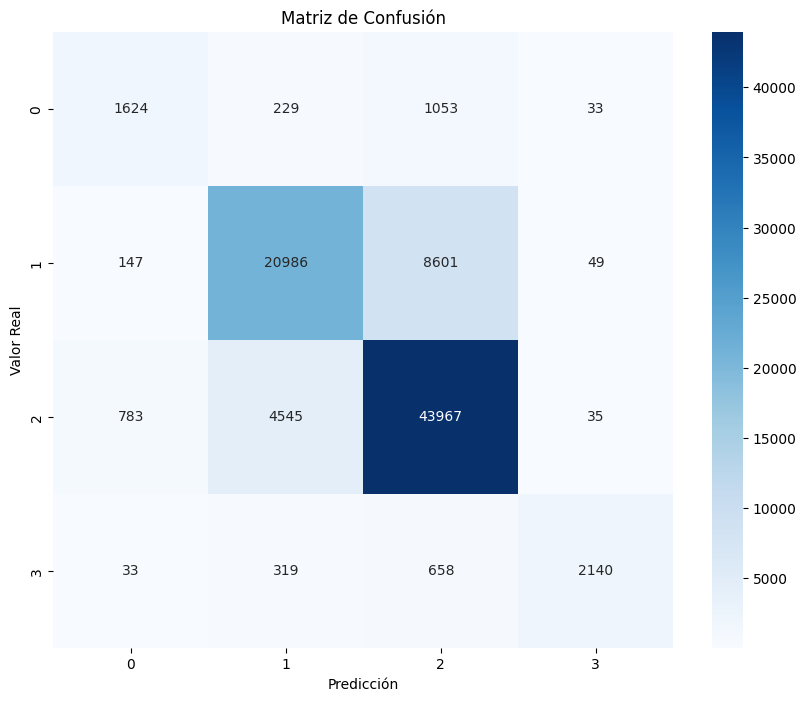

In [36]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', ax=ax)

ax.set_xlabel('Predicción')
ax.set_ylabel('Valor Real')
ax.set_title('Matriz de Confusión')

plt.show()

# **Métricas de Evaluación del Modelo**

Para una evaluación más detallada del desempeño del modelo de XGBoost en la predicción de modalidades de robos en Medellín, calculamos varias métricas clave utilizando la matriz de confusión obtenida.

**Métricas Calculadas:**

**Exactitud (Accuracy):** Proporción de predicciones correctas respecto al total de predicciones realizadas por el modelo.

**Precisión (Precision):** Capacidad del modelo para no predecir una muestra como positiva cuando es negativa.

**Sensibilidad o Recall:** Proporción de positivos reales que fueron correctamente predichos por el modelo.

**F1 Score:** Media armónica de precisión y recall, que proporciona un balance entre ambas métricas.

In [37]:
TP = np.diag(confusion_matrix)

FP = np.sum(confusion_matrix, axis=0) - TP

FN = np.sum(confusion_matrix, axis=1) - TP

TN = np.sum(confusion_matrix) - (FP + FN + TP)

accuracy = np.sum(TP) / np.sum(confusion_matrix)

precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f"Exactitud: {accuracy:.2f}")
print(f"Precisión por clase: {precision}")
print(f"Sensibilidad por clase: {recall}")
print(f"F1 Score por clase: {f1_score}")

Exactitud: 0.81
Precisión por clase: [0.62775416 0.80470877 0.81001861 0.94816128]
Sensibilidad por clase: [0.5525689  0.70463016 0.89128319 0.67936508]
F1 Score por clase: [0.58776692 0.75135154 0.84871005 0.79156649]


# **Identificación de Ejemplos Mal Clasificados**

Este bloque de código se centra en identificar y mostrar ejemplos donde el modelo de clasificación XGBoost no logra predecir correctamente la modalidad de robo.

Este análisis proporciona insights sobre dónde y por qué el modelo puede fallar, ayudando a identificar áreas de mejora o ajuste para optimizar su desempeño en la predicción de la modalidad de robo.

In [38]:
predictions = model.predict(X_test)
probabilities = model.predict_proba(X_test)

misclassified_indices = np.where(predictions != y_test)[0]
misclassified_examples = X_test.iloc[misclassified_indices]

print("Ejemplos de predicciones erróneas:")
for idx in misclassified_indices[:5]:
    print(f"Ejemplo {idx}:")
    print(f"  Características: {misclassified_examples.iloc[idx]}")
    print(f"  Modalidad real: {y_test.iloc[idx]}, Predicción: {predictions[idx]}")
    print(f"  Probabilidades predichas: {probabilities[idx]}")
    print("\n")


Ejemplos de predicciones erróneas:
Ejemplo 8:
  Características: latitud                                         6.273423
longitud                                      -75.562250
edad                                           21.000000
mes_hecho                                       5.000000
hora                                           21.000000
dia_mes                                        21.000000
distancia_a_bank_mas_cercana                    0.003496
distancia_a_police_mas_cercana                  0.010520
distancia_a_university_mas_cercana              0.008309
distancia_a_restaurant_mas_cercana              0.002046
sexo_Hombre                                     1.000000
sexo_Mujer                                      0.000000
sexo_Sin dato                                   0.000000
lugar_agrupado_Comercial                        0.000000
lugar_agrupado_Educación                        0.000000
lugar_agrupado_Entretenimiento                  0.000000
lugar_agrupado_Industri

# **Analisis de clustering**

En esta etapa del proyecto, nos adentramos en el análisis de clustering, una técnica fundamental en el aprendizaje no supervisado. El clustering es un proceso de agrupamiento de datos similares entre sí en grupos o clusters, donde las observaciones dentro de cada grupo son más similares entre sí que con aquellas en otros grupos. Este enfoque nos permite identificar patrones inherentes en nuestros datos sin necesidad de etiquetas previas, lo cual es particularmente útil en situaciones donde no tenemos información sobre las categorías a priori.

En este proyecto específico sobre la incidencia de robos en Medellín, el clustering nos proporcionará insights valiosos al agrupar áreas geográficas con características similares en términos de frecuencia y tipo de robos. Esto nos ayudará a identificar áreas de alto y bajo riesgo, así como a entender mejor los patrones espaciales y temporales de los incidentes de robo en la ciudad. Además, el clustering nos permitirá segmentar eficazmente el conjunto de datos, lo que puede ser útil para la implementación de estrategias de prevención y respuesta más efectivas por parte de las autoridades y la comunidad.

Para preparar nuestros datos para el análisis de clustering, hemos utilizado OrdinalEncoder de la biblioteca sklearn.preprocessing. Este paso es fundamental porque nos permite convertir las variables categóricas de nuestro conjunto de datos en valores numéricos. Primero, creamos una copia de nuestros datos originales,`datos_modelos`, bajo el nombre `datos_cluster`. Luego, identificamos las columnas que contienen datos categóricos utilizando el método   
`select_dtypes` y las transformamos usando OrdinalEncoder. Este proceso asegura que todas las características sean representadas de manera numérica, lo cual es esencial para aplicar algoritmos de clustering, ya que estos métodos requieren datos numéricos para identificar patrones y agrupar observaciones de manera efectiva.

In [56]:
from sklearn.preprocessing import OrdinalEncoder
datos_cluster = datos.copy()
ordinal_encoder = OrdinalEncoder()
categorical_columns = datos_cluster.select_dtypes(include=['object']).columns.tolist()
datos_cluster[categorical_columns] = ordinal_encoder.fit_transform(datos_cluster[categorical_columns])

Para asegurar que nuestros datos estén preparados adecuadamente para el análisis de clustering, hemos aplicado un proceso de escalado utilizando `StandardScaler` de `sklearn.preprocessing`. El objetivo principal del escalado es estandarizar las características numéricas de nuestro conjunto de datos `datos_cluster`. Esto significa que transformamos las variables para que tengan una media de 0 y una desviación estándar de 1. Este paso es esencial porque las características en nuestros datos pueden tener diferentes escalas y varianzas, lo cual podría afectar negativamente la efectividad de los algoritmos de clustering si no se abordan correctamente.



In [57]:
scaler = StandardScaler()
hurtos_scaled = scaler.fit_transform(datos_cluster)

**El método del codo** nos permite determinar el número óptimo de clusters para nuestros datos utilizando K-means. En la gráfica mostrada, observamos cómo la inercia (suma de distancias cuadradas de las muestras al centro del cluster más cercano) disminuye a medida que aumentamos el número de clusters. El punto donde la curva comienza a aplanarse indica el número óptimo de clusters, ya que agregar más clusters no proporciona una mejora significativa en la inercia. Este análisis nos ayuda a tomar una decisión fundamentada sobre el número de grupos a utilizar en nuestro estudio de clustering de hurtos en Medellín.

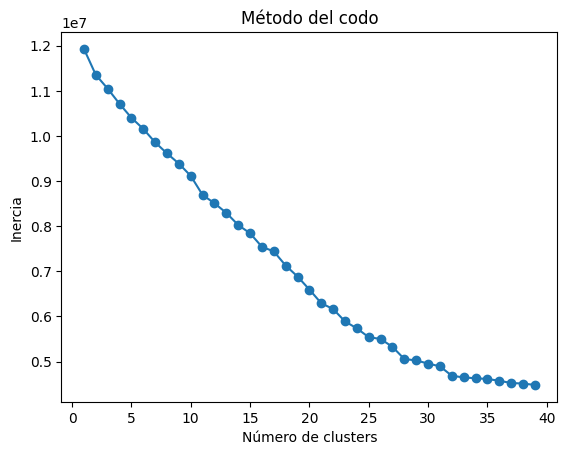

In [41]:
inertias = []
for i in range(1, 40):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(hurtos_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 40), inertias, marker='o')
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.show()


Se ha elegido utilizar 30 clusters para el algoritmo K-means. Este número se determinó utilizando el método del codo, que sugiere que 30 clusters son adecuados para capturar la estructura de los datos de hurtos en Medellín de manera efectiva.

Para la aplicación del algoritmo de clustering K-means, se han seleccionado diversos parámetros con el fin de optimizar la agrupación de datos según las características de los hurtos en Medellín. El parámetro principal es el número de clusters `n_clusters`, el cual se ha fijado en 30 tras un análisis preliminar de la inercia de los datos escalados. Este número se considera adecuado para capturar las distintas tipologías de incidentes.

**Además, se ha configurado el algoritmo con los siguientes parámetros adicionales:**

**Inicialización de centroides (init):** Se ha optado por 'k-means++', un método que elige de manera inteligente la ubicación inicial de los centroides para acelerar la convergencia y mejorar la calidad de los clusters.

**Número máximo de iteraciones (max_iter):** Aunque el valor predeterminado es 300, se ha mantenido para asegurar que el algoritmo converja correctamente.

**Tolerancia de convergencia (tol):** Se ha establecido en 1e-4 para definir la precisión requerida en la convergencia del algoritmo.

**Método de distancia (algorithm):** El algoritmo elegido automáticamente ajusta el método de cálculo de distancias según las características de los datos, maximizando la eficiencia del proceso.

**Número de ejecuciones (n_init):** Se ejecutará el algoritmo 10 veces con diferentes semillas iniciales para mitigar el riesgo de converger en un mínimo local y obtener resultados más estables y confiables.

In [58]:
kmeans = KMeans(n_clusters=30, random_state=0, init='k-means++', max_iter=300, tol=1e-4, algorithm='auto', n_init=10)

In [59]:
datos_cluster['kmeans_cluster'] = kmeans.fit_predict(hurtos_scaled)
cluster_counts = datos_cluster['kmeans_cluster'].value_counts().sort_index()
cluster_counts

kmeans_cluster
0      7921
1     12469
2     14929
3     13190
4     12364
5     14626
6     14481
7      7746
8      5962
9     18313
10    13155
11    13295
12    20494
13     9615
14     4675
15     8384
16     9063
17      689
18     1157
19     9020
20    12642
21    11299
22     1289
23     9457
24    11363
25     3811
26    10949
27      943
28     2623
29     8081
Name: count, dtype: int64

# **Visualizando los clusters de hurtos en Medellín sobre un mapa de los barrios de la ciudad**

In [60]:
barrios_solo = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")

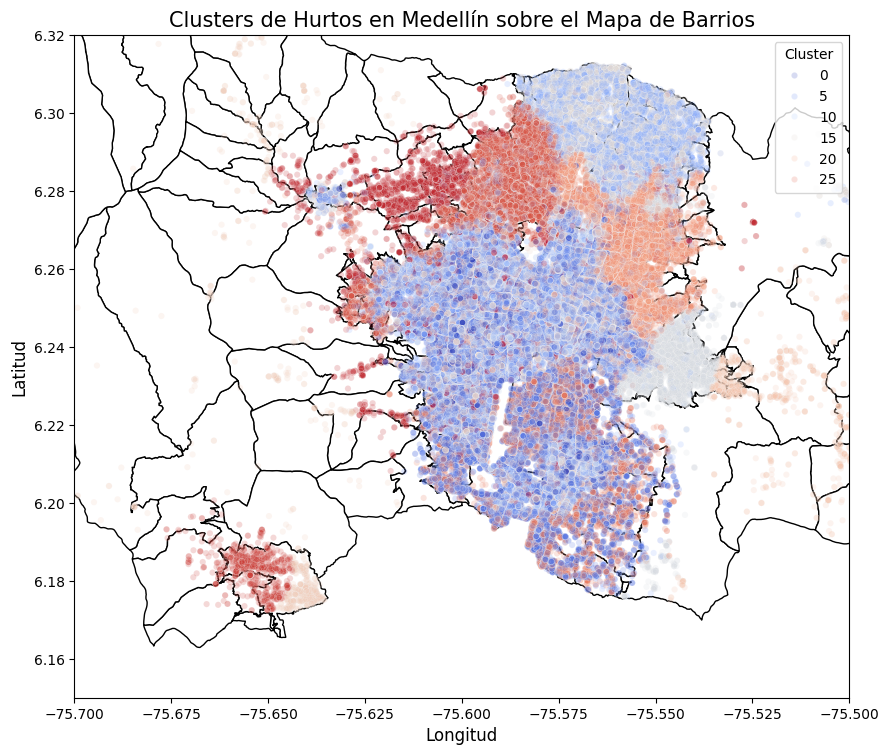

In [61]:

fig, ax = plt.subplots(figsize=(10, 10))
barrios_solo.plot(ax=ax, edgecolor='black', color='white')

ax.set_xlim([-75.70, -75.5])
ax.set_ylim([6.15, 6.32])

sns.scatterplot(
    x='longitud', y='latitud', hue='kmeans_cluster',
    data=datos_cluster, palette='coolwarm', alpha=0.2, s=20, ax=ax
)

plt.title('Clusters de Hurtos en Medellín sobre el Mapa de Barrios', fontsize=15)
plt.xlabel('Longitud', fontsize=12)
plt.ylabel('Latitud', fontsize=12)
plt.legend(title='Cluster', fontsize=10, loc='upper right')
plt.show()

# **Descripciones de cada cluster**
Este análisis es fundamental para entender las características distintivas de cada cluster identificado por el algoritmo de clustering. Ayuda a identificar patrones o perfiles específicos dentro de los datos que pueden tener implicaciones significativas para el análisis y la toma de decisiones, como la asignación de recursos o la implementación de estrategias de seguridad pública en Medellín.

In [87]:
cluster_descriptions = datos_cluster.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.236610 -75.584773  0.378361  36.082944        5.383159   
1               6.243436 -75.578157  0.147005  31.419761        9.639747   
2               6.246166 -75.578737  0.000000  31.873267        9.724161   
3               6.213990 -75.577441  0.372782  33.310766        8.573541   
4               6.239314 -75.577984  0.005985  31.522323        8.660142   
5               6.245214 -75.581880  0.000000  31.638794        9.688363   
6               6.244627 -75.576166  0.000000  29.706443        9.670741   
7               6.295217 -75.561587  0.467080  34.809321        8.245159   
8               6.244484 -75.581262  0.232976  34.090909        6.637370   
9               6.244990 -75.581493  1.021187  31.621089        9.608147   
10              6.244563 -75.577796  1.012163  31.058761        9.596807   
11          

# **Resultados del clustering por cada grupo**

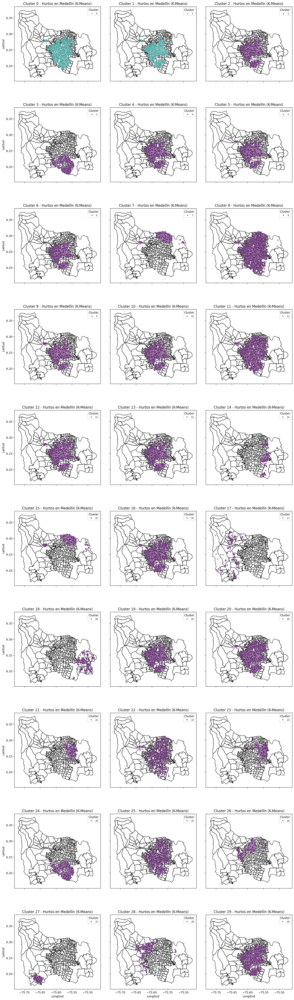

In [92]:
num_clusters = len(cluster_descriptions)
rows = (num_clusters + 2) // 3
cols = min(3, num_clusters)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5), sharex=True, sharey=True)

if rows == 1:
    axes = [axes]

for i, ax in enumerate(axes.flat):
    if i < num_clusters:
        barrios_solo.plot(ax=ax, edgecolor='black', color='white')

        cluster_data = datos_cluster[datos_cluster['kmeans_cluster'] == i]

        sns.scatterplot(
            x='longitud', y='latitud', hue='kmeans_cluster',
            data=cluster_data, palette='viridis', alpha=0.6, s=20, ax=ax
        )

        ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=12)
        ax.set_xlabel('Longitud', fontsize=10)
        ax.set_ylabel('Latitud', fontsize=10)
        ax.legend(title='Cluster', fontsize=8, loc='upper right')

plt.tight_layout(pad=3.0)
plt.show()


# **KDE**

El Kernel Density Estimation (KDE) es una técnica utilizada en estadística y visualización de datos para estimar la distribución de probabilidades de una variable continua. En el contexto del análisis de clusters de hurtos en Medellín, el KDE nos permite representar gráficamente la densidad de puntos geográficos donde ocurren los hurtos, diferenciados por cada cluster identificado previamente mediante K-Means. Esto se logra al generar una superficie continua basada en los puntos individuales de latitud y longitud de cada incidente de hurto en el dataset.

Visualmente, el KDE muestra cómo se agrupan los incidentes en áreas específicas de la ciudad, destacando zonas con mayor densidad de hurtos en colores más intensos en el mapa. Esta representación no solo facilita la identificación de patrones espaciales y áreas de alta concentración de delitos, sino que también ayuda a los analistas y autoridades a entender mejor la distribución geográfica de los problemas de seguridad urbana, proporcionando así una base para el diseño de estrategias preventivas y de respuesta más efectivas.

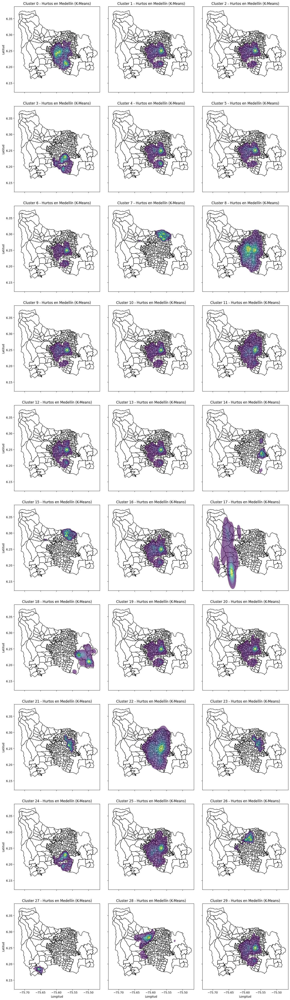

In [93]:
num_clusters = len(cluster_descriptions)

rows = (num_clusters + 2) // 3
cols = min(3, num_clusters)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5), sharex=True, sharey=True)

if rows == 1:
    axes = [axes]

for i, ax in enumerate(axes.flat):
    if i < num_clusters:
        barrios_solo.plot(ax=ax, edgecolor='black', color='white')

        cluster_data = datos_cluster[datos_cluster['kmeans_cluster'] == i]

        sns.kdeplot(
            x=cluster_data['longitud'], y=cluster_data['latitud'],
            fill=True, cmap='viridis', alpha=0.6, ax=ax
        )

        ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=12)
        ax.set_xlabel('Longitud', fontsize=10)
        ax.set_ylabel('Latitud', fontsize=10)

plt.tight_layout(pad=3.0)
plt.show()


# **Visualización de características promedio por cluster: Explorando la agrupación de datos por K-means en el análisis de hurtos en Medellín**

Con el objetivo de obtener una comprensión más detallada de cada grupo de clusters, llevamos a cabo un análisis inverso sobre las descripciones obtenidas de cada cluster. Este proceso nos permite visualizar cómo K-means agrupó en promedio los datos de incidentes de hurtos en Medellín, revelando patrones y características distintivas de cada grupo.

La importancia de esta visualización radica en su capacidad para proporcionar insights significativos sobre la distribución y naturaleza de los hurtos en diferentes áreas de la ciudad. Al examinar las características promedio, podemos identificar áreas con perfiles demográficos específicos, modalidades de robo prevalentes, horarios típicos de ocurrencia, y distancias relativas a servicios como bancos, policía y universidades. Esto no solo ayuda a comprender la dinámica de la criminalidad en Medellín, sino que también facilita la formulación de estrategias más efectivas para la prevención y el control del delito en cada zona.

Al usar técnicas como K-means clustering y análisis inverso de características, los analistas y responsables de políticas públicas pueden tomar decisiones informadas basadas en datos concretos, mejorando así la seguridad y calidad de vida de los ciudadanos. Este enfoque no solo es útil en la seguridad pública, sino que también tiene aplicaciones en la planificación urbana, la asignación de recursos policiales y la implementación de programas de intervención comunitaria."

In [91]:
datos_cluster_descripciones = ordinal_encoder.inverse_transform(cluster_descriptions[categorical_columns])
datos_cluster_descripciones = pd.DataFrame(datos_cluster_descripciones, columns=categorical_columns)
cluster_descriptions[categorical_columns] = datos_cluster_descripciones
cluster_descriptions.head(len(cluster_descriptions))

,latitud,longitud,sexo,edad,lugar_agrupado,mes_hecho,dia_semana_hecho,hora,dia_mes,medio_transporte,modalidad,distancia_a_bank_mas_cercana,distancia_a_police_mas_cercana,distancia_a_university_mas_cercana,distancia_a_restaurant_mas_cercana,arma_medio,grupo_bien
kmeans_cluster,,,,,,,,,,,,,,,,,
0,6.236610,-75.584773,Hombre,36.082944,Religioso,7.080798,Saturday,14.444893,15.909355,Bicicleta,Robo con Violencia o Amenaza,0.003465,0.006045,0.008019,0.001630,No,Mercancía
1,6.243436,-75.578157,Hombre,31.419761,Servicios,7.151576,Saturday,3.666693,15.274441,Bicicleta,Robo con Violencia o Amenaza,0.002999,0.005166,0.005678,0.001514,Arma cortopunzante,Mercancía
2,6.246166,-75.578737,Hombre,31.873267,Servicios,6.511421,Friday,17.139460,15.261237,Bicicleta,Robo con Engaño o Sin Violencia,0.003020,0.005190,0.005130,0.001487,Arma cortopunzante,Mercancía
3,6.213990,-75.577441,Hombre,33.310766,Seguridad,6.778241,Sunday,13.213192,15.823806,Bicicleta,Robo con Violencia o Amenaza,0.004963,0.013570,0.015598,0.004266,Arma de fuego,Mercancía
4,6.239314,-75.577984,Hombre,31.522323,Seguridad,7.257279,Saturday,4.539308,16.084358,Bicicleta,Robo con Engaño o Sin Violencia,0.002714,0.004772,0.006652,0.001339,Llave maestra,Mercancía
5,6.245214,-75.581880,Hombre,31.638794,Servicios,6.558799,Tuesday,16.455080,15.740325,Bicicleta,Robo con Engaño o Sin Violencia,0.003115,0.005155,0.005427,0.001544,Arma cortopunzante,Mercancía
6,6.244627,-75.576166,Hombre,29.706443,Servicios,6.822802,Sunday,16.741869,14.608660,Bicicleta,Robo con Engaño o Sin Violencia,0.002548,0.004744,0.005190,0.001329,No,Mercancía
7,6.295217,-75.561587,Hombre,34.809321,Seguridad,6.715208,Saturday,11.420862,15.773044,Caminata,Robo con Engaño o Sin Violencia,0.005817,0.005056,0.024363,0.003452,No,Mercancía
8,6.244484,-75.581262,Hombre,34.090909,Residencial,6.673767,Sunday,12.101308,15.706139,Caminata,Robo con Engaño o Sin Violencia,0.004700,0.006746,0.008467,0.002366,Llave maestra,Sin dato
